# Azure AI Foundry - GPT-5 examples

GPT-5 in Azure AI Foundry: Built for real-world workloads
In Azure AI Foundry, the GPT-5 models are available via API and orchestrated by themodel router. The GPT-5 series spans complementary strengths:

- GPT-5, a full reasoning model provides deep, richer reasoning for analytics and complex tasks, like code generation, with a 272k token context.
- GPT-5 mini powers real-time experiences for apps and agents that require reasoning, tool calling to solve customer problems.
- GPT-5 nano is a new class of reasoning model which focuses on ultra-low-latency and speed with rich Q&A capabilities.
- GPT-5 chat enables natural, multimodal, multi-turn conversations that remain context-aware throughout agentic workflows, with 128k token context.
Together, the suite delivers a seamless continuum from rigorous agentic coding tasks, to relatively simple Q&A—all delivered with the same Azure AI Foundry endpoint using model router in Foundry Models.

Under the hood, GPT-5 unifies advanced reasoning, code generation, and natural language interaction. It combines analytical depth with intuitive dialogue to solve end-to-end problems and explain its approach. Agentic capabilities allow multi-step tool use and long action chains with transparent, auditable decisions. As a frontier-level coding model, GPT-5 can plan complex agentic workflow, build migrations, and refactor code, as well as produce tests and- ocumentation with clear rationale. Developer controls—including parameters like reasoning_effort and verbosity—let teams tune depth, speed, and detail, while new freeform tool-calling features enable broadens tool compatibility without rigid schemas.

Azure:
- https://azure.microsoft.com/en-us/blog/gpt-5-in-azure-ai-foundry-the-future-of-ai-apps-and-agents-starts-here/?msockid=2e39c66c693c66a5151fd200687567d0

OpenAI:
- https://openai.com/index/introducing-gpt-5/
- https://openai.com/index/introducing-gpt-5-for-developers/

Features:
- https://learn.microsoft.com/en-us/azure/ai-foundry/openai/how-to/reasoning?tabs=gpt-5%2Cpython-secure%2Cpy#api--feature-support

Availability:
- https://learn.microsoft.com/en-us/azure/ai-foundry/openai/how-to/reasoning?tabs=gpt-5%2Cpython-secure%2Cpy#region-availability

In [1]:
import base64
import datetime
import gradio as gr
import matplotlib.pyplot as plt
import mimetypes
import openai
import os
import requests
import sys
import tempfile
import time

from dotenv import load_dotenv
from IPython.display import display, FileLink, SVG
from io import BytesIO
from openai import AzureOpenAI
from PIL import Image
from pydantic import BaseModel

In [2]:
sys.version

'3.10.14 (main, May  6 2024, 19:42:50) [GCC 11.2.0]'

In [3]:
print(f"Today is {datetime.datetime.today().strftime('%d-%b-%Y %H:%M:%S')}")

Today is 26-Aug-2025 13:01:37


## 1. Settings

In [4]:
load_dotenv("azure.env")

endpoint = os.getenv("endpoint")
key = os.getenv("key")

model = "gpt-5"  # We are going to use the standard gpt5 model here in these examples. You should deploy this model in Azure AI Foundry

## 2. Helper

In [5]:
def gpt5(prompt, **kwargs):
    """
    Sends a prompt to the GPT-5 model and returns the response.

    Parameters:
        prompt (str): The input prompt to send.
        model (str): The model to use (default is "gpt-5").
        **kwargs: Additional keyword arguments for customization (e.g., verbosity, reasoning).

    Returns:
        response: The full response object from the client.
    """
    try:
        client = AzureOpenAI(
            base_url=f"{endpoint}openai/v1/",
            api_key=key,
            api_version="preview",
        )
        response = client.responses.create(model=model, input=prompt, **kwargs)
        return response

    except Exception as e:
        print(f"Error during GPT-5 request: {e}")
        return None

In [6]:
def gpt5_image(prompt, image):
    """
    Sends a prompt and an image (local file or URL) to the GPT-5 model and returns the generated output text.

    Parameters:
        prompt (str): The textual input to guide the model.
        image (str): Path to a local image file OR a URL pointing to an image.
        model (str): The model to use (default is "gpt-5").

    Returns:
        str: The generated output text from the model, or None if an error occurs.
    """
    try:
        client = AzureOpenAI(
            base_url=f"{endpoint}openai/v1/",
            api_key=key,
            api_version="preview",
        )

        # Check if the source is a URL or a local file
        if image.startswith("http://") or image.startswith("https://"):
            # Use image URL directly
            image_payload = {"type": "input_image", "image_url": image}
        else:
            # Assume it's a local file, encode to base64
            mime_type, _ = mimetypes.guess_type(image)
            if mime_type is None:
                mime_type = "image/png"

            with open(image, "rb") as f:
                image_base64 = base64.b64encode(f.read()).decode("utf-8")

            image_data_url = f"data:{mime_type};base64,{image_base64}"
            image_payload = {
                "type": "input_image",
                "image_url": image_data_url
            }

        # Response
        response = client.responses.create(model=model,
                                           input=[{
                                               "role":
                                               "user",
                                               "content": [{
                                                   "type": "input_text",
                                                   "text": prompt
                                               }, image_payload]
                                           }])

        output_text = ""

        for item in response.output:
            if hasattr(item, "content") and item.content:
                for content in item.content:
                    if hasattr(content, "text") and content.text:
                        output_text += content.text

        return output_text.strip()

    except Exception as e:
        print(f"Error during GPT-5 image request: {e}")
        return None

In [7]:
def images_comparison(image1, image2, comparison_prompt=None):
    """
    Compare two images using GPT-5 model.
    
    Parameters:
        image1 (str): Path to first image file OR URL
        image2 (str): Path to second image file OR URL  
        comparison_prompt (str): Optional custom prompt for comparison
        
    Returns:
        str: The comparison analysis from GPT-5, or None if error occurs
    """
    try:
        client = AzureOpenAI(
            base_url=f"{endpoint}openai/v1/",
            api_key=key,
            api_version="preview",
        )

        # Process first image
        if image1.startswith("http://") or image1.startswith("https://"):
            image1_payload = {"type": "input_image", "image_url": image1}
        else:
            mime_type, _ = mimetypes.guess_type(image1)
            if mime_type is None:
                mime_type = "image/png"
            with open(image1, "rb") as f:
                image1_base64 = base64.b64encode(f.read()).decode("utf-8")
            image1_data_url = f"data:{mime_type};base64,{image1_base64}"
            image1_payload = {
                "type": "input_image",
                "image_url": image1_data_url
            }

        # Process second image
        if image2.startswith("http://") or image2.startswith("https://"):
            image2_payload = {"type": "input_image", "image_url": image2}
        else:
            mime_type, _ = mimetypes.guess_type(image2)
            if mime_type is None:
                mime_type = "image/png"
            with open(image2, "rb") as f:
                image2_base64 = base64.b64encode(f.read()).decode("utf-8")
            image2_data_url = f"data:{mime_type};base64,{image2_base64}"
            image2_payload = {
                "type": "input_image",
                "image_url": image2_data_url
            }

        # Default comparison prompt if none provided
        if comparison_prompt is None:
            comparison_prompt = """Please compare these two images in detail. 
            Analyze:
            1. Visual similarities and differences
            2. Content, objects, and subjects present
            3. Style, composition, and aesthetic elements
            4. Color schemes and lighting
            5. Overall quality and technical aspects
            6. Any notable patterns or themes
            
            Provide a comprehensive comparison highlighting both similarities and key differences."""

        # Create the request with both images
        response = client.responses.create(
            model=model,  # You'll need to define this variable
            input=[{
                "role":
                "user",
                "content": [{
                    "type": "input_text",
                    "text": comparison_prompt
                }, image1_payload, image2_payload]
            }])

        # Extract the response text
        output_text = ""
        for item in response.output:
            if hasattr(item, "content") and item.content:
                for content in item.content:
                    if hasattr(content, "text") and content.text:
                        output_text += content.text

        return output_text.strip()

    except Exception as e:
        print(f"Error during image comparison: {e}")
        return None

In [8]:
def images_similarity(image1, image2):
    """
    Focused comparison to determine similarity between two images.
    Returns a similarity analysis with specific focus on matching elements.
    """

    similarity_prompt = """
    Compare these two images and provide:
    1. A similarity score from 1-10 (10 is the best score ie 'nearly identical', 0 is the lowest score)
    2. List of matching elements or features
    3. Key differences that distinguish them
    4. Whether they appear to be the same subject/scene
    5. Your confidence level in the comparison
    
    Be specific and detailed in your analysis.
    """

    return images_comparison(image1, image2, similarity_prompt)

In [9]:
def images_quality(image1, image2):
    """
    Compare the technical quality and characteristics of two images.
    """
    quality_prompt = """
    Compare the technical quality of these two images:
    1. Resolution and clarity
    2. Lighting quality and exposure
    3. Color accuracy and saturation
    4. Composition and framing
    5. Overall professional quality
    6. Which image is technically superior and why
    
    Provide specific technical observations.
    """

    return images_comparison(image1, image2, quality_prompt)

In [10]:
def display_images(image1_path, image2_path, titles=None, figsize=(12, 6)):
    """
    Display two local images side by side using PIL and matplotlib.
    
    Parameters:
    image1_path (str): Path to the first image
    image2_path (str): Path to the second image  
    titles (list, optional): List of two strings for image titles
    figsize (tuple): Figure size as (width, height). Default is (12, 6)
    
    Returns:
    None
    """

    # Check if files exist
    if not os.path.exists(image1_path):
        raise FileNotFoundError(f"Image 1 not found: {image1_path}")
    if not os.path.exists(image2_path):
        raise FileNotFoundError(f"Image 2 not found: {image2_path}")

    try:
        # Load images
        img1 = Image.open(image1_path)
        img2 = Image.open(image2_path)
        
        # Create figure with two subplots
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=figsize)
        
        # Display first image
        ax1.imshow(img1)
        ax1.axis('off')
        if titles and len(titles) >= 1:
            ax1.set_title(titles[0])
        else:
            ax1.set_title(os.path.basename(image1_path))
        
        # Display second image
        ax2.imshow(img2)
        ax2.axis('off')
        if titles and len(titles) >= 2:
            ax2.set_title(titles[1])
        else:
            ax2.set_title(os.path.basename(image2_path))
        
        # Adjust layout and show
        plt.tight_layout()
        plt.show()

    except Exception as e:
        print(f"Error loading or displaying images: {e}")

## 3. Test

### Simple Chat Completion method

In [11]:
client = AzureOpenAI(
    api_version="2024-12-01-preview",
    azure_endpoint=endpoint,
    api_key=key,
)

response = client.chat.completions.create(
    messages=[{
        "role": "system",
        "content": "You are a helpful assistant.",
    }, {
        "role": "user",
        "content": "I am going to Paris, what should I see around the Champs-Elyzées?",
    }],
    max_completion_tokens=16384,
    model=model,
)

print("\033[1;31;34m")
print(response.choices[0].message.content)


Great area to explore. Here are the top highlights in and around the Champs-Élysées, plus an easy walking route.

Iconic landmarks
- Arc de Triomphe: View from the rooftop is fantastic at sunset; Tomb of the Unknown Soldier with the nightly flame ceremony.
- Avenue des Champs-Élysées: Grand boulevard for a stroll, window-shopping, and people-watching. Historic Fouquet’s brasserie and Ladurée for macarons.
- Place de la Concorde: Luxor Obelisk, fountains, and grand perspectives down to the Tuileries and the Louvre.

Grand architecture and museums
- Petit Palais: Beautiful Beaux-Arts museum; permanent collection is free, and the courtyard café is a hidden gem.
- Grand Palais: Check current status/exhibitions as it’s been undergoing renovation.
- Pont Alexandre III: Ornate bridge with great photo ops of the Eiffel Tower and Invalides.
- Hôtel de la Marine (at Concorde): Sumptuous historic interiors; book ahead for timed entry.
- Musée de l’Orangerie (in the Tuileries): Monet’s Water Lili

### Using the response api

In [12]:
answer = gpt5("Hello. Who are you?")

print("\033[1;31;34m")
print(answer)


Response(id='resp_68adb052011881908862815d39725b8908a93ad7daebb414', created_at=1756213330.0, error=None, incomplete_details=None, instructions=None, metadata={}, model='gpt-5', object='response', output=[ResponseReasoningItem(id='rs_68adb0535700819096ff662ae6513fa608a93ad7daebb414', summary=[], type='reasoning', encrypted_content=None, status=None), ResponseOutputMessage(id='msg_68adb0562da4819080d0430d2c611e7a08a93ad7daebb414', content=[ResponseOutputText(annotations=[], text='Hi! I’m an AI assistant from OpenAI. I can help answer questions, brainstorm ideas, write or edit text, analyze images, and more. How can I help you today?', type='output_text')], role='assistant', status='completed', type='message')], parallel_tool_calls=True, temperature=1.0, tool_choice='auto', tools=[], top_p=1.0, background=False, max_output_tokens=None, previous_response_id=None, reasoning=Reasoning(effort='medium', generate_summary=None, summary=None), service_tier='default', status='completed', text=Re

In [13]:
print("\033[1;31;34m")
print(answer.model_dump_json(indent=5))


{
     "id": "resp_68adb052011881908862815d39725b8908a93ad7daebb414",
     "created_at": 1756213330.0,
     "error": null,
     "incomplete_details": null,
     "instructions": null,
     "metadata": {},
     "model": "gpt-5",
     "object": "response",
     "output": [
          {
               "id": "rs_68adb0535700819096ff662ae6513fa608a93ad7daebb414",
               "summary": [],
               "type": "reasoning",
               "encrypted_content": null,
               "status": null
          },
          {
               "id": "msg_68adb0562da4819080d0430d2c611e7a08a93ad7daebb414",
               "content": [
                    {
                         "annotations": [],
                         "text": "Hi! I’m an AI assistant from OpenAI. I can help answer questions, brainstorm ideas, write or edit text, analyze images, and more. How can I help you today?",
                         "type": "output_text"
                    }
               ],
               "role": "ass

In [14]:
print("\033[1;34m", end="")
print(answer.output[1].content[0].text)

Hi! I’m an AI assistant from OpenAI. I can help answer questions, brainstorm ideas, write or edit text, analyze images, and more. How can I help you today?


## 4. New parameters

In [15]:
prompt = "What are V2G and V2X? What are the benefits?"

In [16]:
client = AzureOpenAI(
    base_url=f"{endpoint}openai/v1/",
    api_key=key,
    api_version="preview",
)

In [17]:
response = client.responses.create(
    input=prompt,
    model=model,
    reasoning={
        "effort": "minimal",  # minimal, low, medium, high. Medium is the default value.
        "summary": "auto"  # auto, concise, detailed 
    },
    text={"verbosity": "low"})  # low, medium, high

print("\033[1;31;34m")
print(response.model_dump_json(indent=5))


{
     "id": "resp_68adb057c37481908941d1c8351d8e0e02d4aaf4485c4f8a",
     "created_at": 1756213335.0,
     "error": null,
     "incomplete_details": null,
     "instructions": null,
     "metadata": {},
     "model": "gpt-5",
     "object": "response",
     "output": [
          {
               "id": "rs_68adb05844608190981dd9b10f205b8d02d4aaf4485c4f8a",
               "summary": [],
               "type": "reasoning",
               "encrypted_content": null,
               "status": null
          },
          {
               "id": "msg_68adb0585ea4819082715c8450199e9a02d4aaf4485c4f8a",
               "content": [
                    {
                         "annotations": [],
                         "text": "V2G and V2X are ways electric vehicles (EVs) interact with the electric grid and other energy systems.\n\n- V2G (Vehicle-to-Grid): EVs discharge power back to the electricity grid when needed, and charge when surplus power is available.\n- V2X (Vehicle-to-Everything): Bro

In [18]:
print("\033[1;34m", end="")
print(response.output[1].content[0].text)

V2G and V2X are ways electric vehicles (EVs) interact with the electric grid and other energy systems.

- V2G (Vehicle-to-Grid): EVs discharge power back to the electricity grid when needed, and charge when surplus power is available.
- V2X (Vehicle-to-Everything): Broader concept where EVs supply power to various endpoints, including:
  - V2H: Vehicle-to-Home
  - V2B: Vehicle-to-Building
  - V2L: Vehicle-to-Load (directly powering devices)
  - V2G: Vehicle-to-Grid (a subset)

Benefits:
- Grid support: Peak shaving, frequency regulation, voltage support, and emergency reserves.
- Renewable integration: Absorbs excess solar/wind and supplies during lulls.
- Cost savings: Lower charging costs via time-of-use; revenue from grid services.
- Backup power: Homes/buildings can use EVs during outages.
- Infrastructure deferral: Reduces need for new grid capacity.
- Emissions reduction: Optimizes use of cleaner, off-peak generation.
- Fleet optimization: Fleets monetize idle time and improve en

### Verbosity values (low, medium or high)

In [20]:
prompt = """
Create a 60-day learning plan to become proficient in Python programming for data analysis, targeting a beginner with no prior programming experience. The plan should include daily learning goals, relevant resources (articles, videos, tutorials, documentation, interactive coding exercises - describe the types of resources that would be helpful, such as online coding platforms, interactive tutorials, and documentation for Python libraries, and where they can typically be found online, such as Codecademy, Coursera, edX, and official Python documentation), practical exercises (coding challenges,  creating different types of programs for data manipulation and analysis, working with datasets - describe the kinds of projects that would be appropriate, such as analyzing a public dataset, building a simple data visualization tool, or creating a program to automate data cleaning), and self-assessment methods (quizzes, mini-projects, creating a portfolio of data analysis projects - describe the kinds of projects that would be appropriate, such as analyzing a dataset and presenting the findings in a report or creating an interactive data visualization). Focus on key areas of Python for
data analysis, including 1) basic syntax and data structures, 2) working with libraries like NumPy and Pandas, 3) data cleaning and preprocessing techniques, 4) data visualization with Matplotlib and Seaborn, and 5) basic statistical analysis. Include links to reputable online learning platforms and communities, such as Analytics Vidhya, DataCamp, and Udemy.
"""

for verbosity in ["low", "medium", "high"]:
    start = time.time()
    response = client.responses.create(model=model,
                                       input=prompt,
                                       text={"verbosity": verbosity})
    elapsed = time.time() - start
    minutes, seconds = divmod(elapsed, 60)

    output_text = ""

    for item in response.output:
        if hasattr(item, "content") and item.content:
            for content in item.content:
                if hasattr(content, "text") and content.text:
                    output_text += content.text

    print("\033[1;31;32m")
    print("-" * 120)
    print(f"Verbosity Level: {verbosity.upper()}")
    print(f"Tokens Used = {response.usage.output_tokens}")
    print("-" * 120)
    print("\033[0m")
    print(output_text.strip())
    print("\033[1;31;35m")
    print(f">> Elapsed time = {minutes:.0f} minutes and {seconds:.0f} seconds")
    print("\033[0m")


------------------------------------------------------------------------------------------------------------------------
Verbosity Level: LOW
Tokens Used = 6443
------------------------------------------------------------------------------------------------------------------------

Below is a concise, beginner-friendly 60-day plan with daily goals, resources, practical exercises, and self-assessment. Expect 60–120 minutes per day. Adjust pace as needed.

How to use this plan
- Tools: Install Anaconda (Python, Jupyter) or Python + pip, VS Code, and Git/GitHub.
- Learning mix: Watch short lessons, read docs, do interactive exercises, then build something small.
- Track progress: Keep a learning log, push code/notebooks to a GitHub portfolio.

Core platforms and documentation (links)
- Official docs: Python docs.python.org/3, NumPy numpy.org/doc, Pandas pandas.pydata.org/docs, Matplotlib matplotlib.org/stable, Seaborn seaborn.pydata.org, SciPy docs.scipy.org/doc, scikit-learn scikit-lear

### Reasoning values (minimal, low, medium or high). Minimal is the new value.

In [21]:
prompt = "Who won the 2022 FIFA World Cup? Consider different perspectives, analyze the impact of the victory on global football, and discuss the team’s tactical approach in key matches."

for reasoning_effort in ["minimal", "low", "medium", "high"]:
    start = time.time()
    response = client.responses.create(model=model,
                                       input=prompt,
                                       reasoning={"effort": reasoning_effort})
    elapsed = time.time() - start
    minutes, seconds = divmod(elapsed, 60)

    output_text = ""

    for item in response.output:
        if hasattr(item, "content") and item.content:
            for content in item.content:
                if hasattr(content, "text") and content.text:
                    output_text += content.text

    print("\033[1;31;32m")
    print("-" * 120)
    print(f"Reasoning Effort: {reasoning_effort.upper()}")
    print(f"Tokens Used = {response.usage.output_tokens}")
    print("-" * 120)
    print("\033[0m")
    print(output_text.strip())
    print("\033[1;31;35m")
    print(f">> Elapsed time = {minutes:.0f} minutes and {seconds:.0f} seconds")
    print("\033[0m")


------------------------------------------------------------------------------------------------------------------------
Reasoning Effort: MINIMAL
Tokens Used = 1303
------------------------------------------------------------------------------------------------------------------------

Argentina won the 2022 FIFA World Cup, defeating France in the final on December 18, 2022, in Lusail, Qatar. The match ended 3–3 after extra time, with Argentina winning 4–3 on penalties.

Perspectives on the victory
- Historical/legacy: The win secured Argentina’s third World Cup (1978, 1986, 2022) and cemented Lionel Messi’s legacy, widely seen as completing his career résumé. It also echoed Diego Maradona’s 1986 triumph, reinforcing Argentina’s footballing lineage.
- Cultural/national: The title sparked massive celebrations across Argentina amid economic hardship, becoming a unifying national moment and elevating figures like Messi, Ángel Di María, and coach Lionel Scaloni to iconic status.
- Global

## 5. UI design example

In [22]:
prompt = """
Create a clean and simple single-page HTML vacation planner for a team of 4 people: Alice, Bob and John.
Each team member should be able to enter their vacation days using an intuitive UI.
The page should include:

A form or calendar input for each member to select their vacation dates.
A section visible to the manager showing all submitted vacation dates.
A scroll bar if the content exceeds the viewport height.
Responsive layout for desktop and mobile.
Minimal styling for clarity and ease of use.
"""

result = gpt5(prompt)
print(result)

Response(id='resp_68adb2459e0c81908fd5115472e806980b8cf214bc60221e', created_at=1756213829.0, error=None, incomplete_details=None, instructions=None, metadata={}, model='gpt-5', object='response', output=[ResponseReasoningItem(id='rs_68adb247a484819098d15c517c5a1c6b0b8cf214bc60221e', summary=[], type='reasoning', encrypted_content=None, status=None), ResponseOutputMessage(id='msg_68adb25b7a288190bdc98fe6dd1251cf0b8cf214bc60221e', content=[ResponseOutputText(annotations=[], text='Here’s a single-file, clean, and responsive vacation planner. It includes an intuitive date-range input for each team member, a manager view aggregating all submissions, scrolling when content exceeds the viewport, and minimal styling. Note: You mentioned a team of 4 but listed 3 names. I included “Eve” as the 4th member—you can change this name in the code if needed.\n\n<!DOCTYPE html>\n<html lang="en">\n<head>\n  <meta charset="UTF-8" />\n  <meta name="viewport" content="width=device-width, initial-scale=1" /

In [23]:
filename = "calendar.html"

with open(filename, 'w', encoding='utf-8') as f:
    f.write(result.output[1].content[0].text)

link = FileLink(path=filename)
link

/mnt/batch/tasks/shared/LS_root/mounts/clusters/seretkow8/code/Users/seretkow/gpt5/calendar.html

## 6. Structured output

In [24]:
client = AzureOpenAI(azure_endpoint=endpoint,
                     api_key=key,
                     api_version="2024-10-21")


class CalendarEvent(BaseModel):
    name: str
    date: str
    participants: list[str]


completion = client.beta.chat.completions.parse(
    model=model,
    messages=[
        {
            "role": "system",
            "content": "Extract the event information."
        },
        {
            "role": "user",
            "content": "John and Alice will go to the AC/DC concert on Friday."
        },
    ],
    response_format=CalendarEvent,
)

event = completion.choices[0].message.parsed
print("\033[1;31;34m")
print(event)


name='AC/DC concert' date='Friday' participants=['John', 'Alice']


In [25]:
print("\033[1;31;34m")
print(completion.model_dump_json(indent=4))


{
    "id": "chatcmpl-C8nkHz7g0noDSeczwzfeP4sUvCj5I",
    "choices": [
        {
            "finish_reason": "stop",
            "index": 0,
            "logprobs": null,
            "message": {
                "content": "{\"name\":\"AC/DC concert\",\"date\":\"Friday\",\"participants\":[\"John\",\"Alice\"]}",
                "refusal": null,
                "role": "assistant",
                "annotations": [],
                "audio": null,
                "function_call": null,
                "tool_calls": null,
                "parsed": {
                    "name": "AC/DC concert",
                    "date": "Friday",
                    "participants": [
                        "John",
                        "Alice"
                    ]
                }
            },
            "content_filter_results": {
                "hate": {
                    "filtered": false,
                    "severity": "safe"
                },
                "self_harm": {
            

## 7. Function calling with structured outputs

In [26]:
class GetDeliveryDate(BaseModel):
    order_id: str


tools = [openai.pydantic_function_tool(GetDeliveryDate)]

messages = []
messages.append({
    "role":
    "system",
    "content":
    "You are a helpful customer support assistant. Use the supplied tools to assist the user."
})
messages.append({
    "role":
    "user",
    "content":
    "Hi, can you tell me the delivery date for my order #2546187?"
})

response = client.chat.completions.create(model=model,
                                          messages=messages,
                                          tools=tools)

print("\033[1;31;34m")
print(response.choices[0].message.tool_calls[0].function)


Function(arguments='{"order_id":"2546187"}', name='GetDeliveryDate')


In [27]:
print("\033[1;31;34m")
print(response.model_dump_json(indent=4))


{
    "id": "chatcmpl-C8nkMOmTl8fa333S50EIwIf9DrRtc",
    "choices": [
        {
            "finish_reason": "tool_calls",
            "index": 0,
            "logprobs": null,
            "message": {
                "content": null,
                "refusal": null,
                "role": "assistant",
                "annotations": [],
                "audio": null,
                "function_call": null,
                "tool_calls": [
                    {
                        "id": "call_f5vfmcaHoKboRLy0mpS0uYNP",
                        "function": {
                            "arguments": "{\"order_id\":\"2546187\"}",
                            "name": "GetDeliveryDate"
                        },
                        "type": "function"
                    }
                ]
            },
            "content_filter_results": {}
        }
    ],
    "created": 1756213886,
    "model": "gpt-5-2025-08-07",
    "object": "chat.completion",
    "service_tier": null,
    "s

## 8. SVG generation

In [66]:
prompt = "Generate a SVG code of a man walking in a street with a dog"

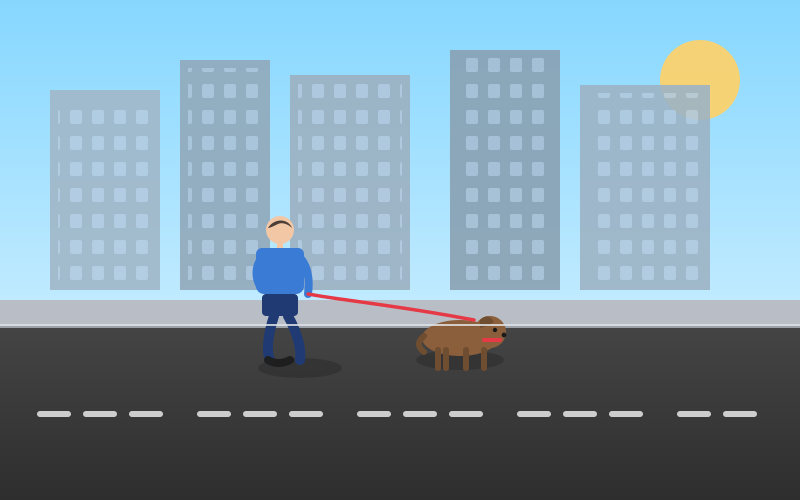

In [67]:
result = gpt5(prompt)
svg_code = result.output[1].content[0].text

display(SVG(data=svg_code))

## 9. OCR

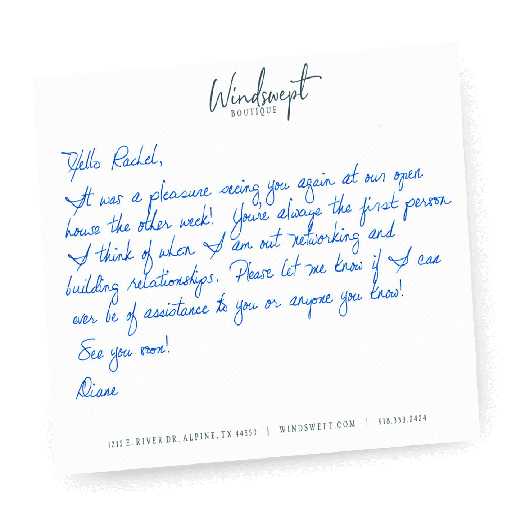

In [30]:
image_url = "https://cdn.handwrytten.com/www/2020/02/home-hero-photo2%402x.png"

img = Image.open(BytesIO(requests.get(image_url).content))
img.resize((512, 512))

In [31]:
prompt = "Extract all the text of this image"

result = gpt5_image(prompt, image_url)

print("\033[1;31;34m")
print(result)


Windswept
BOUTIQUE

Hello Rachel,

It was a pleasure seeing you again at our open house the other week! You’re always the first person I think of when I am out networking and building relationships. Please let me know if I can ever be of assistance to you or anyone you know!

See you soon!

Diane

1215 E. RIVER DR., ALPINE, TX 44550 | WINDSWEPT.COM | 918.333.2424


In [32]:
prompt = "What is this language?"

result = gpt5_image(prompt, image_url)

print("\033[1;31;34m")
print(result)


English (handwritten cursive).


In [33]:
prompt = "What is the color of the ink?"

result = gpt5_image(prompt, image_url)

print("\033[1;31;34m")
print(result)


Blue.


In [34]:
prompt = "Translate this text into French, Japanese and Italian"

result = gpt5_image(prompt, image_url)

print("\033[1;31;34m")
print(result)


- French:
Bonjour Rachel,
C’était un plaisir de te revoir à notre journée portes ouvertes l’autre semaine ! Tu es toujours la première personne à laquelle je pense lorsque je sors pour réseauter et nouer des relations. Dis‑moi si je peux un jour t’être utile, à toi ou à quelqu’un que tu connais !
À bientôt !
Diane

- Japanese:
レイチェルへ
先日のオープンハウスでまたお会いできて嬉しかったです！ ネットワーキングや関係づくりをしていると、いつも真っ先にあなたのことを思い浮かべます。私にできるお手伝いがあれば、あなたやあなたのご友人のためでも、いつでもご連絡ください。
また近いうちに。
ダイアン

- Italian:
Ciao Rachel,
È stato un piacere rivederti al nostro open house l’altra settimana! Sei sempre la prima persona a cui penso quando sono in giro a fare networking e costruire relazioni. Fammi sapere se posso esserti d’aiuto in qualsiasi momento, a te o a qualcuno che conosci!
A presto!
Diane


In [35]:
prompt = "Summarize this text into one sentence"

result = gpt5_image(prompt, image_url)

print("\033[1;31;34m")
print(result)


Diane thanks Rachel for coming to the recent open house, says she often thinks of her when networking, and offers help to her or anyone she knows.


In [36]:
prompt = "Display these entities: NAME, COMPANIES"

result = gpt5_image(prompt, image_url)

print("\033[1;31;34m")
print(result)


{
  "NAME": ["Rachel", "Diane"],
  "COMPANIES": ["Windswept Boutique"]
}


In [37]:
prompt = """
Analyze the sentiment of the following message. 
Classify it as one of the following: POSITIVE, NEUTRAL, or NEGATIVE.

Provide:
1. The sentiment label.
2. A confidence score between 0 and 1 (with 1 being most confident).

Format your response exactly as:
SENTIMENT = SCORE
"""

result = gpt5_image(prompt, image_url)

print("\033[1;31;34m")
print(result)


POSITIVE = 0.98


In [38]:
prompt = "Generate a publication with emojis and hashtags"

result = gpt5_image(prompt, image_url)

print("\033[1;31;34m")
print(result)


Handwritten moments, real connections 💌  
We loved seeing everyone at our open house! Your support means the world. If we can ever help you—or someone you know—send us a DM, call 918-333-2424, or stop by 1215 E. River Dr., Alpine, TX. See you soon! ✨🛍️

#WindsweptBoutique #ThankYou #ShopLocal #SmallBusiness #Community #OpenHouse #HandwrittenNotes #BoutiqueStyle #AlpineTX #SupportLocal #SeeYouSoon


## 10. Images analysis

### Example 1

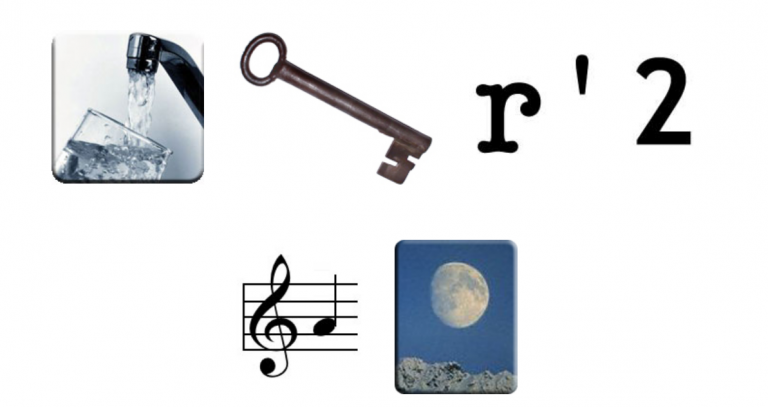

In [39]:
image_url = "https://living-lab.cnam.fr/wp-content/uploads/2023/05/Rebus-768x407.png"

img = Image.open(BytesIO(requests.get(image_url).content))
img

In [40]:
prompt = "What is the answer of this rebu? This rebu is in French."

result = gpt5_image(prompt, image_url)

print("\033[1;31;34m")
print(result)


“Au clair de la lune.”

Explanation:
- “Eau” (water) → sounds like “au”
- “Clé” + “r” → “clair”
- “2” (deux) → “de”
- Musical note “la” → “la”
- Moon image → “lune”

So: au + clair + de + la + lune.


### Example 2

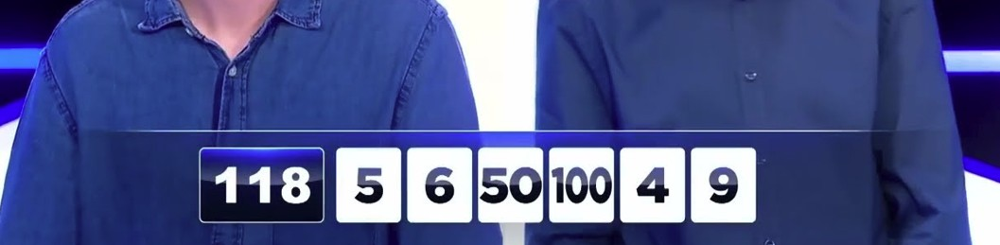

In [41]:
image_path = "image1.jpg"

img = Image.open(image_path)
img

In [42]:
prompt = """
Try to find the number result which is the number at the left using all the numbers and combinaisons in the 6 following others numbers. 
Explain step by step.
Do not use a number from the list more than one time.
Always display the number that you did not use.
Display the used numbers.
"""

result = gpt5_image(prompt, image_path)

print("\033[1;31;34m")
print(result)


Target: 118
Numbers: 5, 6, 50, 100, 4, 9

Steps:
1) 100 + 9 = 109
2) 5 + 4 = 9
3) 109 + 9 = 118

Result: 118

Used numbers: 100, 9, 5, 4
Not used: 6, 50


### Example 3

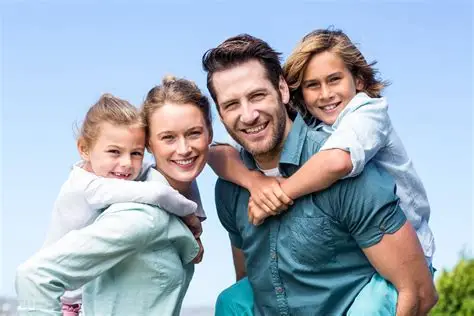

In [43]:
image_url = "https://tse3.mm.bing.net/th/id/OIP.txnMcLArHW-J-8ktcAswngHaE8?cb=thfvnext&rs=1&pid=ImgDetMain&o=7&rm=3"

img = Image.open(BytesIO(requests.get(image_url).content))
img

In [44]:
prompt = "How many people in this image?"

result = gpt5_image(prompt, image_url)

print("\033[1;31;34m")
print(result)


Four people.


In [45]:
prompt = "Provide the gender and age estimation. Generate a quick summary description for each person."

result = gpt5_image(prompt, image_url)

print("\033[1;31;34m")
print(result)


Here are rough, best-effort estimates based on appearance. Faces are blurred, so take as approximate.

- Person 1 (center adult in teal shirt)
  - Apparent gender: male
  - Estimated age: 30–40
  - Summary: Tall build, short dark hair, giving a piggyback ride, casual button-up shirt.

- Person 2 (left adult in light hoodie)
  - Apparent gender: female
  - Estimated age: 28–38
  - Summary: Light/blonde hair tied back, casual hoodie, leaning in while carrying/holding a child.

- Person 3 (child on left/front with light hair)
  - Apparent gender: female
  - Estimated age: 4–6
  - Summary: Small child with light hair in a ponytail, light-colored top, close to the left adult.

- Person 4 (child on right/back with medium-length hair)
  - Apparent gender: male
  - Estimated age: 5–8
  - Summary: Child with light brown hair, aqua/light shirt, riding piggyback on the center adult.


### Example 4

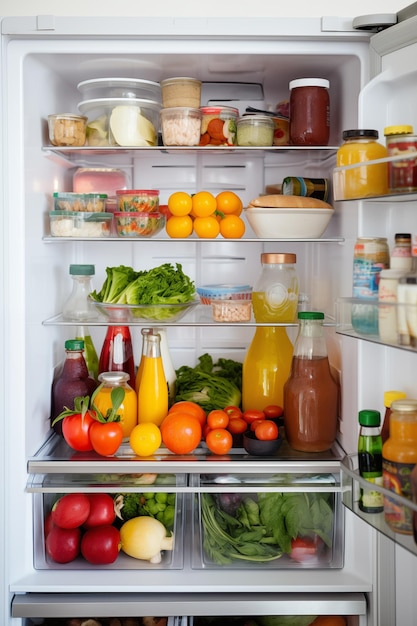

In [46]:
image_url = "https://img.freepik.com/premium-photo/refrigerator-with-different-fruits-vegetables-useful-vitamins-generative-ai_266732-37681.jpg"

img = Image.open(BytesIO(requests.get(image_url).content))
img

In [47]:
prompt = "Propose me a recipe based on the ingredients"

result = gpt5_image(prompt, image_url)

print("\033[1;31;34m")
print(result)


Here’s a one-pan shakshuka you can make with what’s in your fridge, plus a quick side salad.

Shakshuka with Peppers, Spinach and Eggs
Serves 2–3

Ingredients
- 1 onion, sliced
- 2 bell peppers (any colors), sliced
- 2 cups chopped tomatoes or 1½ cups tomato sauce (use both if you have them)
- 3–5 eggs
- 2 handfuls spinach or other leafy greens
- 1–2 tbsp olive oil
- 1 tsp ground cumin + 1 tsp smoked paprika (or chili flakes)
- Salt and pepper
- ½ lemon (zest and juice)
- Optional: feta or any crumbly cheese, hot sauce from the door

Steps
1) Sauté: Heat oil in a wide skillet over medium heat. Add onion and peppers with a pinch of salt; cook 6–8 min until soft and lightly browned.
2) Spice: Stir in cumin and paprika (and a pinch of chili). Cook 30 sec until fragrant.
3) Sauce: Add tomatoes/tomato sauce, a splash of water if thick, and a pinch of salt. Simmer 5–8 min until slightly reduced. Stir in spinach to wilt. Taste and adjust salt/pepper and a squeeze of lemon.
4) Eggs: Make smal

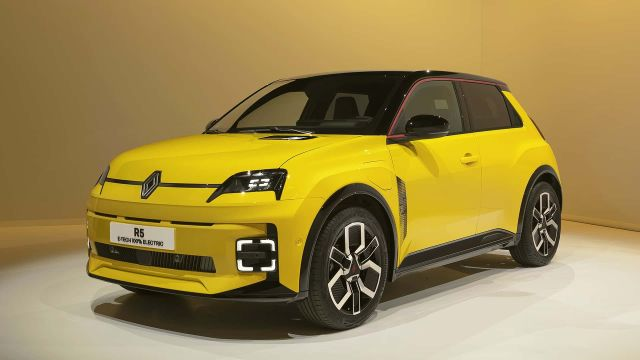


The image shows a bright yellow compact hatchback displayed in a studio setting. It has a black roof with red accents, sculpted bodywork, and large two‑tone alloy wheels. The front features slim headlights and square, bracket‑shaped LED daytime running lights integrated into the bumper. A badge on the nose and a plate reading “R5 E‑TECH FULL ELECTRIC” indicate it’s an electric model from Renault.


In [48]:
image_file = "car1.jpg"
img = Image.open(image_file)
display(img)

result = gpt5_image("Descibe this image", image_file)

print("\033[1;31;34m")
print(result)

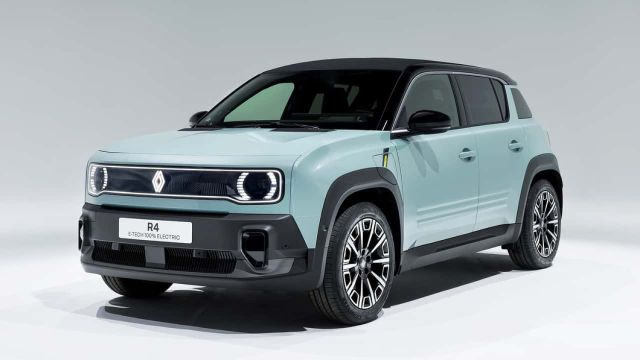


Light pastel blue and black, with some gray/silver accents.


In [49]:
image_file = "car3.jpg"
img = Image.open(image_file)
display(img)

result = gpt5_image("What are the main colors?", image_file)

print("\033[1;31;34m")
print(result)

## 11. Images comparison

### Comparing two images

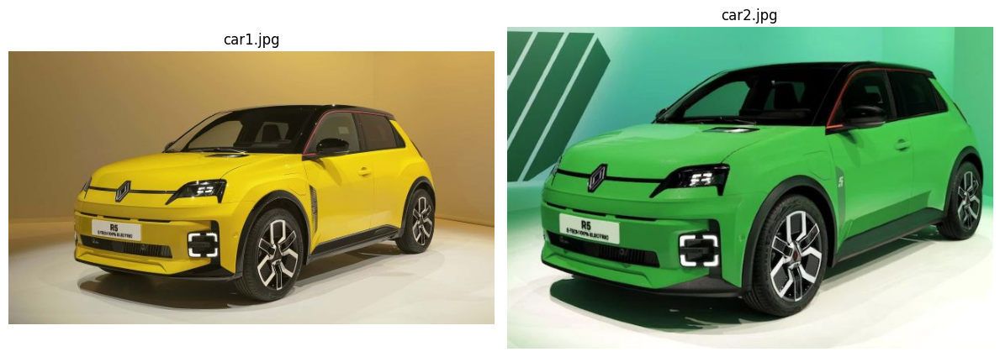

Comparison results of car1.jpg and car2.jpg:


Here’s a side‑by‑side comparison of the two images.

1) Visual similarities and differences
- Similarities:
  - Same car model and trim details: two‑tone hatchback with black roof, black mirrors, red accent along the roof edge, sculpted hood vent, vertical side intake, squared LED DRL elements in the lower bumper, and the same five‑spoke wheels.
  - Same viewing angle: three‑quarter front-left, camera at roughly headlight height, slight rightward facing.
  - Studio setup with clean floor and soft floor shadow.

- Differences:
  - Body color: Image 1 is bright yellow; Image 2 is vivid green.
  - Background: Image 1 has a warm beige/tan studio; Image 2 uses a cool mint/teal backdrop with a diagonal stripe graphic.
  - Badging/markings: Image 2 shows a small “5” badge on the front fender; it’s not visible in Image 1.
  - Trim tone: The lower bumper and side skirt read slightly darker/greyer in Image 2, while Image 1 appears more uniformly bod

In [50]:
image1 = "car1.jpg"
image2 = "car2.jpg"
display_images(image1, image2)

print(f"Comparison results of {image1} and {image2}:\n")
result = images_comparison(image1, image2)

print("\033[1;31;34m")
print(result)

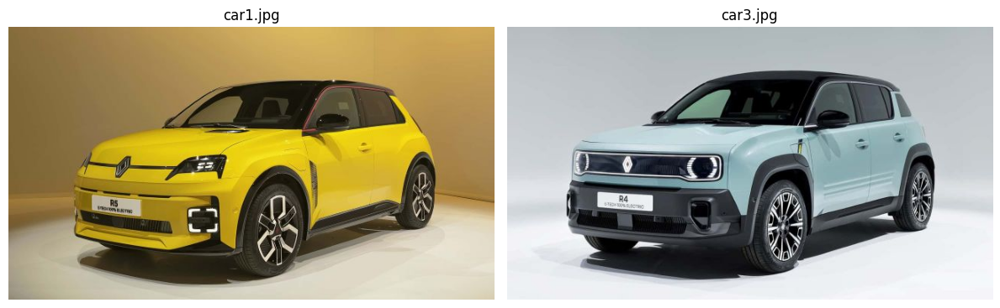

Comparison results of car1.jpg and car3.jpg:


Here’s a side‑by‑side comparison of the two images.

1) Visual similarities and differences
- Similarities:
  - Both images show small electric Renault vehicles shot in studio, front three‑quarter view.
  - Two‑tone schemes: light body color with a contrasting glossy black roof and pillars.
  - Prominent wheel-arch cladding, large alloy wheels, short front overhangs, and upright windshields.
  - Centered Renault badge in a closed grille panel and “E‑Tech 100% Electric” plates.

- Differences:
  - Proportions: R5 (yellow) is lower, sleeker, hatchback-like; R4 (light teal) is taller, boxier, SUV/crossover-like with more ground clearance.
  - Front lighting: R5 uses slim, horizontal headlamps with squared C‑shaped DRLs in the bumper; R4 uses round signature lamps within a rectangular bezel and a full-width grille motif.
  - Surfaces: R5 has taut, sporty surfacing with sharp feature lines and a vertical vent detail behind the front wheel; R4 f

In [51]:
image1 = "car1.jpg"
image2 = "car3.jpg"
display_images(image1, image2)

print(f"Comparison results of {image1} and {image2}:\n")
result = images_comparison(image1, image2)

print("\033[1;31;34m")
print(result)

### Comparing two images with a custom prompt

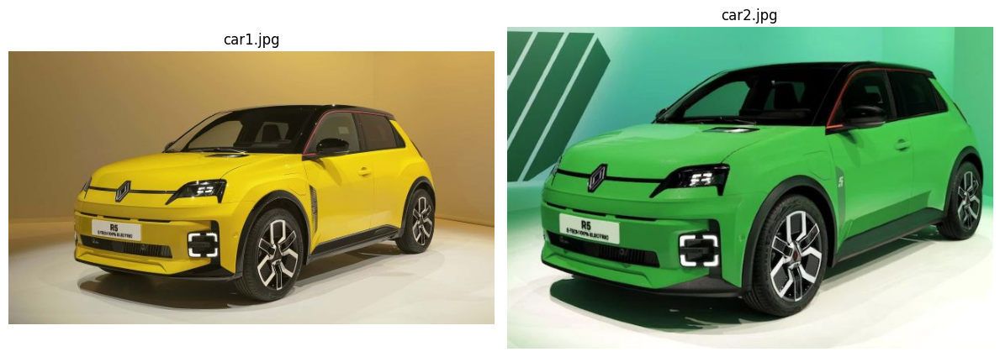

Comparison results of car1.jpg and car2.jpg:


Yes — they depict the same car model.

Reasons:
- Both have the Renault diamond badge and the plate reading “R5 E‑TECH 100% ELECTRIC.”
- Identical front-end design: narrow headlamps with the same LED signature and a distinctive square “bracket” LED in the lower bumper.
- Same body shape and proportions: short hatchback, black roof with a red accent strip along the roof edge, black mirror caps, and the same vertical vent detail on the front fender.
- Same wheel design: five split-spokes with the same machining pattern.
- Matching character lines and cladding along the doors and sills.

Only the body color and background differ (yellow vs. green), so they’re the same model (Renault 5 E‑Tech Electric), though not necessarily the exact same physical car.


In [52]:
image1 = "car1.jpg"
image2 = "car2.jpg"
display_images(image1, image2)

prompt = "Are these two images about the same car? Provide detailed reasoning."

print(f"Comparison results of {image1} and {image2}:\n")
result = images_comparison(image1, image2, prompt)

print("\033[1;31;34m")
print(result)

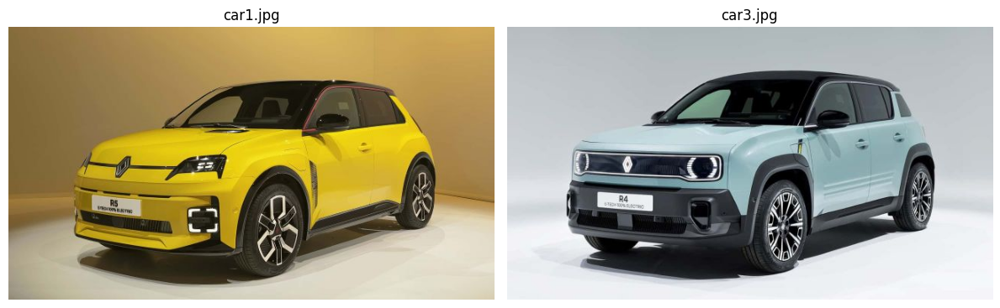

Comparison results of car1.jpg and car3.jpg:


No. They’re different Renault models.

- The plates on the cars read “R5” on the yellow car and “R4” on the blue car.
- Body style: the yellow car is a low, sporty 3‑door hatchback; the blue one is a taller, boxier 5‑door crossover/SUV.
- Front design: the yellow car has slim, horizontal headlights with square lower lights; the blue one has round headlights set in a rectangular grille.
- Proportions and cladding differ (the blue car has pronounced black wheel-arch cladding and a more upright profile).

So the images show two different cars, though from the same brand.


In [53]:
image1 = "car1.jpg"
image2 = "car3.jpg"
display_images(image1, image2)

prompt = "Are these two images about the same car? Provide detailed reasoning."

print(f"Comparison results of {image1} and {image2}:\n")
result = images_comparison(image1, image2, prompt)

print("\033[1;31;34m")
print(result)

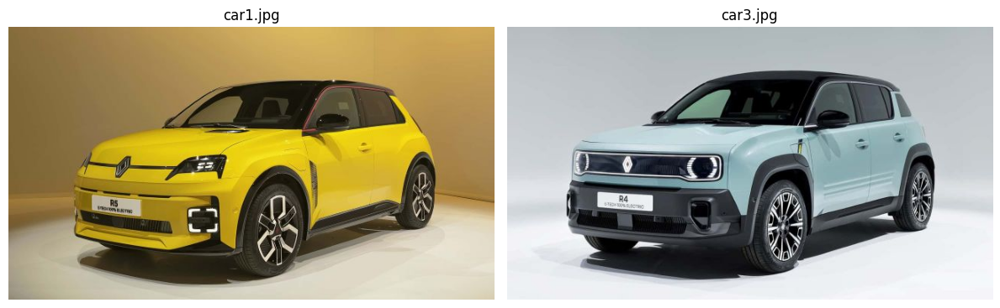

Comparison results of car1.jpg and car3.jpg:


Yes. Both are from Renault (R5 and R4).


In [54]:
image1 = "car1.jpg"
image2 = "car3.jpg"
display_images(image1, image2)

prompt = "Is it the same car manufacturer?"

print(f"Comparison results of {image1} and {image2}:\n")
result = images_comparison(image1, image2, prompt)

print("\033[1;31;34m")
print(result)

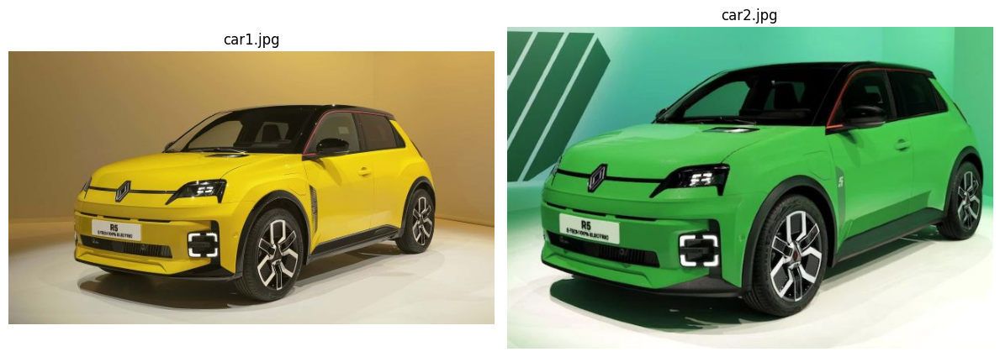

Comparison results of car1.jpg and car2.jpg:


- First car: yellow (with a black roof)
- Second car: green (with a black roof)


In [55]:
image1 = "car1.jpg"
image2 = "car2.jpg"
display_images(image1, image2)

prompt = "What are the colors of these two cars?"

print(f"Comparison results of {image1} and {image2}:\n")
result = images_comparison(image1, image2, prompt)

print("\033[1;31;34m")
print(result)

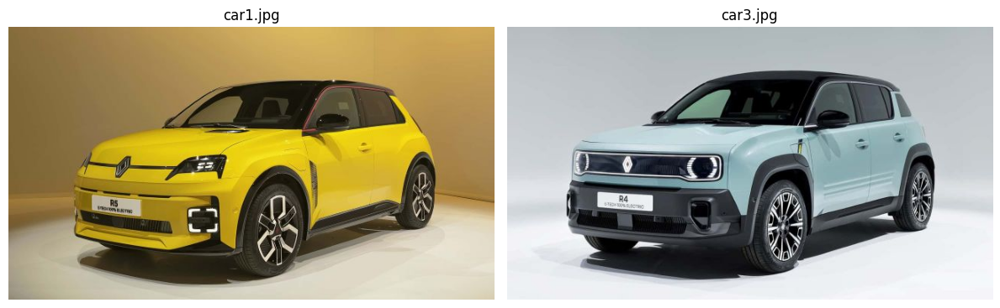

Comparison results of car1.jpg and car3.jpg:


- Top: Renault 5 (R5) E‑Tech Electric  
- Bottom: Renault 4 (R4) E‑Tech Electric, also known as the 4Ever Electric concept


In [56]:
image1 = "car1.jpg"
image2 = "car3.jpg"
display_images(image1, image2)

prompt = "What are the car names and models?"

print(f"Comparison results of {image1} and {image2}:\n")
result = images_comparison(image1, image2, prompt)

print("\033[1;31;34m")
print(result)

### Similarity analysis

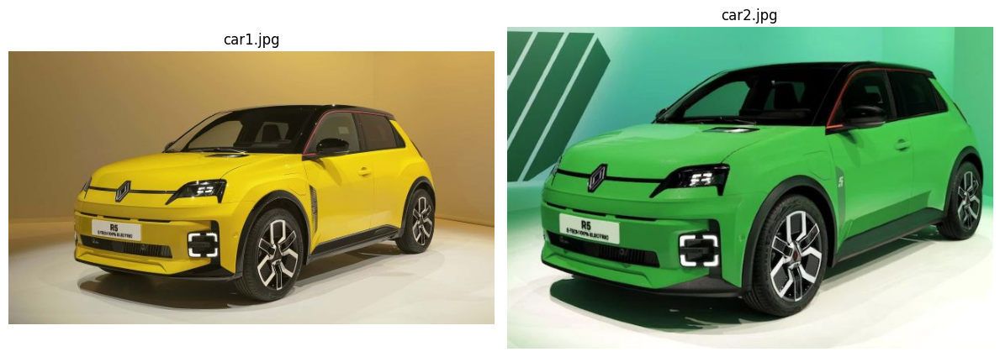

Similarity analysis of car1.jpg and car2.jpg:


1) Similarity score: 9/10

2) Matching elements/features:
- Same compact hatchback model and body shape
- Identical front fascia: slim horizontal headlamps, square/C-shaped LED DRLs in the lower corners, central badge, slim upper grille
- Same wheel design (five-spoke geometric alloys) and black wheel-arch cladding
- Black roof with a red accent strip along the roof edge
- Same side sculpting: strong shoulder line, squared rear quarter, vertical vent/aero feature behind the front wheel
- Hood detail/vent on the left side
- Black mirror caps, black rocker trim
- Similar studio-style 3/4 front-left angle and stance
- Plate reads “R5 … ELECTRIC/PROTO” on both

3) Key differences:
- Body color: yellow vs. green
- Background/set color: warm beige vs. green with a diagonal graphic element
- Lighting/reflectivity differs, changing highlights and perceived panel tones
- The “5” badge on the front fender is clearly visible on the green car; it’s l

In [57]:
image1 = "car1.jpg"
image2 = "car2.jpg"
display_images(image1, image2)

print(f"Similarity analysis of {image1} and {image2}:\n")
similarity_result = images_similarity(image1, image2)

print("\033[1;31;34m")
print(similarity_result)

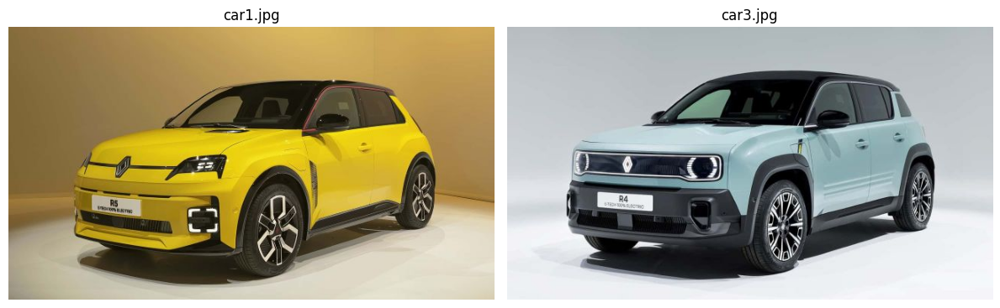

Similarity analysis of car1.jpg and car3.jpg:


1) Similarity score: 4/10

2) Matching elements/features:
- Same brand badge on the nose
- Studio setting with clean background, three‑quarter front view
- Two‑tone paint (colored body with black roof and mirrors)
- Modern LED lighting signatures
- Prominent black lower bumper/side cladding
- Large alloy wheels with geometric patterns
- Short front/rear overhangs, compact proportions
- Text on plates indicates electric powertrains (“E‑TECH 100% ELECTRIC”)

3) Key differences:
- Model and badging: one reads “R5,” the other “R4”
- Body style/shape: R5 is a low, sporty hatchback; R4 is a taller, boxier small SUV/crossover
- Headlights: R5 has narrow horizontal lamps with square C‑shaped DRLs in the bumper; R4 has round lamps set in rectangular housings with a full‑width grille element
- Stance/ride height: R4 sits higher with chunkier wheel‑arch cladding; R5 is lower and more streamlined
- Side details: R5 shows a vertical vent/garnish behin

In [58]:
image1 = "car1.jpg"
image2 = "car3.jpg"
display_images(image1, image2)

print(f"Similarity analysis of {image1} and {image2}:\n")
similarity_result = images_similarity(image1, image2)

print("\033[1;31;34m")
print(similarity_result)

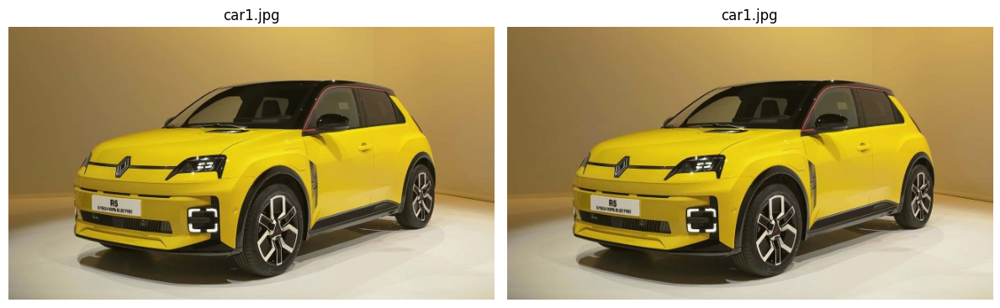

Similarity analysis of car1.jpg and car1.jpg:


1) Similarity score: 10/10

2) Matching elements/features:
- Same yellow compact hatchback with black roof and red accent strip around the roofline
- Identical front three-quarter angle and perspective
- Same headlight shapes and positions, including the rectangular C-shaped lower LED element in the left bumper
- Same black wheel-arch cladding, side vent detail ahead of the door, and sculpted door panel
- Identical five-spoke wheel design and tire orientation
- Same badge and front plate text (“R5 … ELECTRIC,” spacing and font match)
- Identical reflections on bodywork, windshield, and side glass
- Same studio backdrop: warm beige walls and floor, same shadows under the car

3) Key differences:
- None discernible; framing, lighting, reflections, and all visual details appear identical. If any difference exists, it’s not visible at this resolution and could only be compression or metadata.

4) Same subject/scene:
- Yes—these appear to be t

In [59]:
image1 = "car1.jpg"
image2 = "car1.jpg"
display_images(image1, image2)

print(f"Similarity analysis of {image1} and {image2}:\n")
similarity_result = images_similarity(image1, image2)

print("\033[1;31;34m")
print(similarity_result)

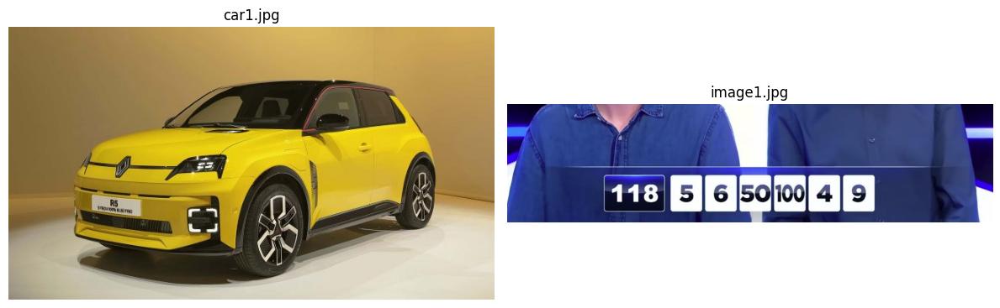

Similarity analysis of car1.jpg and image1.jpg:


1) Similarity score: 1/10

2) Matching elements or features
- Both are color photographs shot indoors with controlled lighting.
- Presence of typography/numbers: left image has a model badge/plate; right image shows large numbers.
- Use of strong geometric shapes and glossy surfaces (car body/panels vs. on-screen tiles).
- Dark accents against a lighter background.

3) Key differences
- Subject: left image is a yellow compact car; right image is a game/quiz-show scoreboard strip with digits and two people’s torsos partially visible.
- Function/context: product/studio showcase vs. TV/game-show moment displaying target and number tiles.
- Composition: three-quarter view of a single object vs. a wide cropped banner with UI elements and partial humans.
- Color palette: dominant yellow/black on the left; blue/white/black on the right.
- Background: seamless studio backdrop vs. lit set with horizontal light bars.
- Presence of motion/interact

In [60]:
image1 = "car1.jpg"
image2 = "image1.jpg"
display_images(image1, image2)

print(f"Similarity analysis of {image1} and {image2}:\n")
similarity_result = images_similarity(image1, image2)

print("\033[1;31;34m")
print(similarity_result)

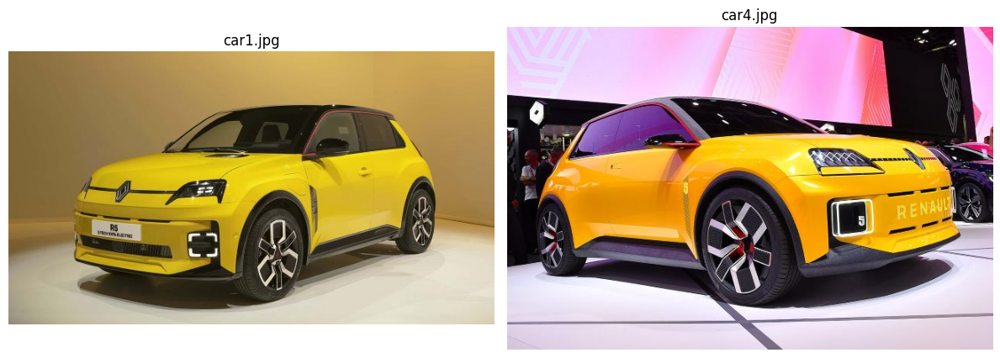

Similarity analysis of car1.jpg and car4.jpg:


1) Similarity score: 8/10

2) Matching elements/features
- Bright yellow compact hatchback with a black roof and black wheel-arch/side-skirt cladding
- Same brand badge on the nose and similar short, upright hood
- Distinctive square/rectangular daytime-running-light element in the lower outer corners of the front bumper
- Five-spoke, aero-style wheels in a black/silver finish
- Vertical textured/vent-like trim ahead of the front doors
- Red accent line around the window/roof perimeter
- Overall proportions and stance: short overhangs, wide track, two-box silhouette
- Left-front three‑quarter view

3) Key differences
- Headlights: 
  - Image 1 has more conventional, single-bar style lamp modules.
  - Image 2 shows pixelated “matrix”-style lamp elements.
- Front fascia details:
  - Image 1 has a plate reading “R5 … ELECTRIC.”
  - Image 2 has large “RENAULT” lettering molded into the front panel.
- DRL square treatment:
  - Image 1’s square

In [61]:
image1 = "car1.jpg"
image2 = "car4.jpg"
display_images(image1, image2)

print(f"Similarity analysis of {image1} and {image2}:\n")
similarity_result = images_similarity(image1, image2)

print("\033[1;31;34m")
print(similarity_result)

### Image quality comparisons

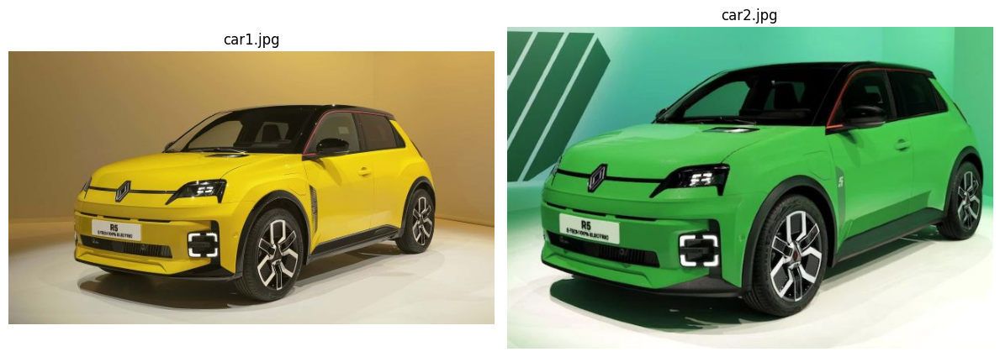

Quality analysis of car1.jpg and car2.jpg:


Here’s a point‑by‑point technical comparison of the two images:

1) Resolution and clarity
- Image 1 (yellow car, beige background): 640×360. Crisp focus with natural micro‑contrast; edges look clean without obvious sharpening halos.
- Image 2 (green car, green background): 640×425. Slightly higher pixel count and very crisp, but shows mild oversharpening halos around high‑contrast edges (badges, DRLs). Minor JPEG artifacts visible in flat background areas.

2) Lighting quality and exposure
- Image 1: Soft, even studio lighting with large sources. Specular highlights are controlled; panel curvature reads well. Exposure is balanced with no obvious clipped highlights or blocked shadows.
- Image 2: Harder, higher‑contrast lighting. Deeper shadows in wheel wells/cabin and stronger speculars on the hood/windshield; some areas approach highlight clipping. Shape readability is a bit reduced in the dark interior.

3) Color accuracy and saturation
- 

In [62]:
image1 = "car1.jpg"
image2 = "car2.jpg"
display_images(image1, image2)

print(f"Quality analysis of {image1} and {image2}:\n")
quality_result = images_quality(image1, image2)

print("\033[1;31;34m")
print(quality_result)

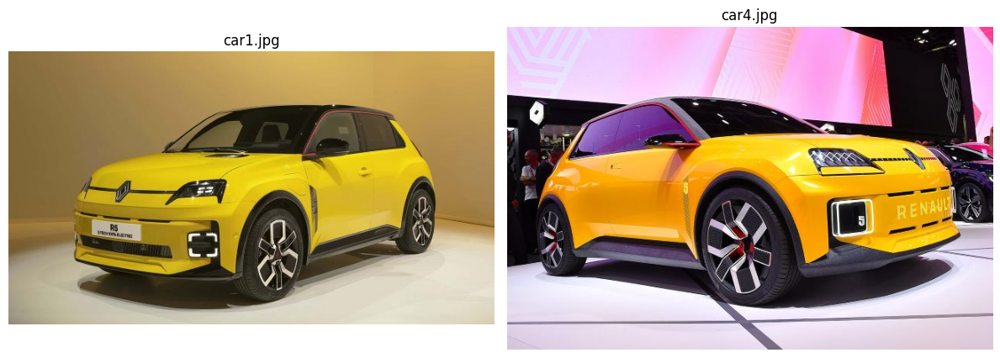

Quality analysis of car1.jpg and car4.jpg:


Here’s a side‑by‑side technical comparison.

1) Resolution and clarity
- Image 1: Crisp panel lines and wheel tread detail; low noise; fine textures (grille, headlight edges) hold up well. No obvious motion blur. At this size it looks the cleaner file.
- Image 2: Also sharp, but micro-contrast is lowered by heavy specular reflections from the show lights. Some fine detail on the hood and door skin is masked by glare.

2) Lighting quality and exposure
- Image 1: Controlled studio-style lighting with soft, even key and fill. Speculars are shaped and not blown; shadow detail in wheel wells and underbody is retained. Dynamic range is well managed.
- Image 2: Mixed, hard event lighting with strong LED panels causing bright hotspots and deep shadows. Noticeable highlight clipping on light panels and their reflections on the hood/fender; harsher contrast under the car.

3) Color accuracy and saturation
- Image 1: Neutral-to-warm white balance; the 

In [63]:
image1 = "car1.jpg"
image2 = "car4.jpg"
display_images(image1, image2)

print(f"Quality analysis of {image1} and {image2}:\n")
quality_result = images_quality(image1, image2)

print("\033[1;31;34m")
print(quality_result)

## 12. Gradio webapp

In [64]:
def gpt5_image(prompt, image):
    """
    Sends a prompt and an image (local file or URL) to the GPT-5 model and returns the generated output text.
    Parameters:
        prompt (str): The textual input to guide the model.
        image (str): Path to a local image file OR a URL pointing to an image.
    Returns:
        str: The generated output text from the model, or None if an error occurs.
    """
    try:
        client = AzureOpenAI(
            base_url=f"{endpoint}openai/v1/",
            api_key=key,
            api_version="preview",
        )
        # Check if the source is a URL or a local file
        if image.startswith("http://") or image.startswith("https://"):
            # Use image URL directly
            image_payload = {"type": "input_image", "image_url": image}
        else:
            # Assume it's a local file, encode to base64
            mime_type, _ = mimetypes.guess_type(image)
            if mime_type is None:
                mime_type = "image/png"
            with open(image, "rb") as f:
                image_base64 = base64.b64encode(f.read()).decode("utf-8")
            image_data_url = f"data:{mime_type};base64,{image_base64}"
            image_payload = {
                "type": "input_image",
                "image_url": image_data_url
            }
        # Response
        response = client.responses.create(
            model="gpt-5",
            input=[{
                "role": "user",
                "content": [{
                    "type": "input_text",
                    "text": prompt
                }, image_payload]
            }]
        )
        output_text = ""
        for item in response.output:
            if hasattr(item, "content") and item.content:
                for content in item.content:
                    if hasattr(content, "text") and content.text:
                        output_text += content.text
        return output_text.strip()
    except Exception as e:
        return f"Error during GPT-5 image request: {e}"


def gradiowebapp(image, prompt, image_url):
    """
    Wrapper function for Gradio interface
    """
    if not prompt.strip():
        return "Please enter a prompt to analyze the image."
    
    if image is not None:
        # Save uploaded image to temporary file
        with tempfile.NamedTemporaryFile(delete=False, suffix=".png") as tmp_file:
            image.save(tmp_file.name, format="PNG")
            result = gpt5_image(prompt, tmp_file.name)
            # Clean up temporary file
            os.unlink(tmp_file.name)
            return result
    elif image_url.strip():
        return gpt5_image(prompt, image_url.strip())
    else:
        return "Please provide either an image upload or an image URL."


# Create Gradio interface
with gr.Blocks(title="GPT-5 Image Analysis with Azure AI Foundry", theme=gr.themes.Soft()) as webapp:
    gr.Markdown(
        """
        # 🤖 GPT-5 Image Analysis with Azure AI Foundry
        
        Upload an image or provide an image URL, then enter a prompt to get AI-powered analysis and insights.
        """
    )
    
    with gr.Row():
        with gr.Column(scale=1):
            # Image input options
            gr.Markdown("### 📸 Your image")
            image_upload = gr.Image(
                type="pil",
                label="Upload Image",
                height=300,
            )
            
            gr.Markdown("**OR**")
            
            image_url = gr.Textbox(
                label="Image URL",
                placeholder="https://example.com/image.jpg",
                lines=1,
            )
            
            # Prompt input
            gr.Markdown("### 💭 Prompt")
            prompt = gr.Textbox(
                label="Enter your prompt",
                placeholder="Describe what you see in this image...",
                lines=3,
                value="Describe what you see in this image in detail.",
            )
            
            # Action button
            analyze_btn = gr.Button(
                "🔍 Analyze Image",
                variant="primary",
                size="lg",
            )
        
        with gr.Column(scale=1):
            # Output
            gr.Markdown("### 📝 Analysis Result")
            output = gr.Textbox(
                label="Azure AI Foundry GPT-5 Response",
                lines=15,
                max_lines=20,
                show_copy_button=True,
            )
    
    # Example prompts
    gr.Markdown("### 💡 Examples")
    example_prompts = [
        "Describe this image in detail.",
        "What are the main objects and their relationships in this image?",
        "Analyze the composition, colors, and mood of this image.",
        "What story does this image tell?",
        "Extract all the text in this image.",
        "What emotions or feelings does this image evoke?",
        "Describe the setting and context of this scene."
    ]
    
    with gr.Row():
        for i, example in enumerate(example_prompts[:4]):
            gr.Button(example, size="sm").click(
                lambda x=example: x,
                outputs=prompt
            )
    
    with gr.Row():
        for i, example in enumerate(example_prompts[4:]):
            gr.Button(example, size="sm").click(
                lambda x=example: x,
                outputs=prompt
            )
    
    # Event handlers
    analyze_btn.click(
        fn=gradiowebapp,
        inputs=[image_upload, prompt, image_url],
        outputs=output,
        show_progress=True,
    )
    
    prompt.submit(
        fn=gradiowebapp,
        inputs=[image_upload, prompt, image_url],
        outputs=output,
        show_progress=True,
    )
    
    # Footer
    gr.Markdown(
        """
        ---
        **Note:** Make sure to set your Azure AI Foundry credentials for the GPT5 model.
        """
    )


In [65]:
webapp.launch(
    share=True,  # Set to True if you want a public link
    show_error=True,
)

* Running on local URL:  http://127.0.0.1:7860
* Running on public URL: https://fee5caf489723343a2.gradio.live

This share link expires in 72 hours. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


<img src="gradio.jpg">